In [0]:
%pip install beautifulsoup4 spacy-transformers unidecode markdownify
dbutils.library.restartPython()

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
  Using cached Unidecode-1.3.8-py3-none-any.whl (235 kB)
  Using cached markdownify-0.14.1-py3-none-any.whl (11 kB)
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


In [0]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns 
import spacy

from bs4 import BeautifulSoup
from spacy_transformers import Transformer
from unidecode import unidecode
from html import unescape
from markdownify import MarkdownConverter, chomp

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/transformers/utils/generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(


## Pull in the JDs you extracted from the TID, making sure you have the following columns:
1. Unique ID of JD
2. Text of JD 

In [0]:
# INSTRUCTION: Input location of file you're pulling in
# INSTRUCTION: Rename the column with the text of the JDs you want to run the models on to 'text_original' e.g.'job_description' to 'text_original'

df_data = pd.read_csv('/Workspace/Users/justin.ngam@towerswatson.com/1_Benefits/1_NER/Data/~ov/Model_Training/v5/EVALUATION/data/test.csv')

df_data = df_data.rename(columns={'job_description': 'text_original'})

display(df_data)

id company title industry country text_original 156363 DNV GL Senior Loads Measurements Engineer Professional Services Germany 


 
 
 
 
 
Senior Loads Measurements Engineer 
 
 
 
 Location 
 
DE-Kaiser-Wilhelm-Koog | DE-Hamburg 
 
 
 
 
 
 
 Requisition ID 
 
2022-17908 
 
 
 
 Business Area 
 
Energy Systems 
 
 
 
 Category/Discipline 
 
Engineering 
 
 
 
 Posting Position Type 
 
Permanent Employee 
 
 
 
 
 
 




























 



Local Unit & Position Description


 



 
 
 
 The Section Loads, Power Performance and Wind Resource is part of the Department “Measurements Northern Europe” and is located in Hamburg and Kaiser-Wilhelm-Koog, Germany. The Section measures and analyses the loads on the whole structure of a wind turbine, evaluates the characteristic power curve of a specific turbine, measures the wind speed on site and provides diverse services involving LiDAR technology including equipment verification, classification as well as wind resource and power performance assessment.   The Section currently consists of 17 employees.   Responsibilities: Technical Project Delivery of wind turbine loads measurements projects Responsible lead and project manager for larger and challenging projects Preparation, execution and administration Lead and supervision of project team Planning and supervision / execution of installation and commissioning of loads measurement equipment Data acquisition, plausibility check, post-processing, analysis and evaluation Programming and quality control of tools required for project execution Reporting and checking reports Development of state-of-the-art content to present at conferences and/or online posting Act as an active member in committee work and represent DNV 

 
 
 





 



Position Qualifications


 



 
 
 
 Essential skills and experience for this role are as follows: A technical higher education degree (minimum Bachelor) in a relevant field Deep knowledge of and experience with wind turbine loads measurements (4-6 years as a minimum) Deep understanding of all relevant standards and recommended practices involving wind turbine loads measurements Programming of algorithm and data analysis (we work with MATLAB, Python and FAMOS) Excellent organisational and time management skills Excellent communication skills in English, both written and oral Working knowledge of German, both written and oral Willingness to travel (domestic and international) Driver's license Suitably qualified and/or willing to take part in health and safety trainings to undertake working at heights, work on construction sites, and work involving electrical hazards (and any other required trainings e.g. confined spaces training as applicable)   Join us and you will: Work with dedicated, competent, highly educated and specialized colleagues in a global set up Be part of an international team with diverse backgrounds and an open, cooperative working atmosphere Be exposed to demanding customer inquiries in an interesting and challenging, international environment with diverse international projects Experience exciting challenges and a new way of thinking in an ever-changing energy world Have an exciting and attractive working environment with a high degree of individual responsibility which you can actively shape Benefit from attractive, individual training and development opportunities as well as an attractive salary package Flexible place of work (in an attractive office, from home and in our clients' facilities) and flexible working hours The opportunity to actively shape the energy transition 

 
 
 





 



Company & Business Area Description


 



 
 
 
 DNV is the independent expert in assurance and risk management, operating in more than 100 countries. Through our broad experience and deep expertise we advance safety and sustainable performance, set industry benchmarks, and inspire and invent solutions.    We provide assurance to the entire energy value chain through our advisory, monito

## Convert the HTML in 'text_original' to readable text for model

In [0]:
class CustomMDConverter(MarkdownConverter):
    def convert_hn(self, n, el, text, convert_as_inline):
        return text + '\n\n'
    def convert_blockquote(self, el, text, convert_as_inline):
        return '\n' + (text + '\n\n') if text else ''
    def convert_chomped(self, el, text, convert_as_inline):
        prefix, suffix, text = chomp(text)
        return '{}{}{}'.format(prefix, suffix, text)
    def convert_img(self, el, text, convert_as_inline):
        return '\n\n'
    def convert_script(self, el, text, convert_as_inline):
        return ''
    def convert_br(self, el, text, convert_as_inline):
        return '\n'  # Converts <br> to a newline character

    convert_figure = convert_img
    convert_strong = convert_b = convert_em = convert_i = convert_a = convert_chomped


md = CustomMDConverter(escape_asterisks=False, escape_underscores=False)

def convert_to_text(text):
    text = unescape(text)  # Unescape HTML entities first
    if '/>' in text or '</' in text or '<' in text:
        try:
            text = md.convert(text)
        except:
            return ''
    
    text = unidecode(text)
    text = "\n".join([_.strip() for _ in text.split('\n')])
    text = re.sub(r'\ +', ' ', text)
    text = re.sub(r'(\n+){3,}', '\n\n', text)
    text = text.strip()

    # Clean up backslashes, newlines, and carriage returns
    text = re.sub(r'\\', '', text)   # Remove literal backslashes
    text = re.sub(r'\n', ' ', text)  # Replace newlines with spaces
    text = re.sub(r'\r', '', text)   # Remove carriage returns
    text = text.strip()  # Trim again after replacements
    
    text = text.replace(r'\-', '-')
    text = text.replace(r'\&', '&')
    text = text.replace(r'\|', '|')
    text = text.replace(r'\*', '*')
    text = text.replace(r'\"', '"')
    text = text.replace(r'\+', '+')
    
    return text

In [0]:
# Run HTML conversion function on text_original
df_data['text']=df_data['text_original'].apply(convert_to_text)
display(df_data)

id company title industry country text_original text 156363 DNV GL Senior Loads Measurements Engineer Professional Services Germany 


 
 
 
 
 
Senior Loads Measurements Engineer 
 
 
 
 Location 
 
DE-Kaiser-Wilhelm-Koog | DE-Hamburg 
 
 
 
 
 
 
 Requisition ID 
 
2022-17908 
 
 
 
 Business Area 
 
Energy Systems 
 
 
 
 Category/Discipline 
 
Engineering 
 
 
 
 Posting Position Type 
 
Permanent Employee 
 
 
 
 
 
 




























 



Local Unit & Position Description


 



 
 
 
 The Section Loads, Power Performance and Wind Resource is part of the Department “Measurements Northern Europe” and is located in Hamburg and Kaiser-Wilhelm-Koog, Germany. The Section measures and analyses the loads on the whole structure of a wind turbine, evaluates the characteristic power curve of a specific turbine, measures the wind speed on site and provides diverse services involving LiDAR technology including equipment verification, classification as well as wind resource and power performance assessment.   The Section currently consists of 17 employees.   Responsibilities: Technical Project Delivery of wind turbine loads measurements projects Responsible lead and project manager for larger and challenging projects Preparation, execution and administration Lead and supervision of project team Planning and supervision / execution of installation and commissioning of loads measurement equipment Data acquisition, plausibility check, post-processing, analysis and evaluation Programming and quality control of tools required for project execution Reporting and checking reports Development of state-of-the-art content to present at conferences and/or online posting Act as an active member in committee work and represent DNV 

 
 
 





 



Position Qualifications


 



 
 
 
 Essential skills and experience for this role are as follows: A technical higher education degree (minimum Bachelor) in a relevant field Deep knowledge of and experience with wind turbine loads measurements (4-6 years as a minimum) Deep understanding of all relevant standards and recommended practices involving wind turbine loads measurements Programming of algorithm and data analysis (we work with MATLAB, Python and FAMOS) Excellent organisational and time management skills Excellent communication skills in English, both written and oral Working knowledge of German, both written and oral Willingness to travel (domestic and international) Driver's license Suitably qualified and/or willing to take part in health and safety trainings to undertake working at heights, work on construction sites, and work involving electrical hazards (and any other required trainings e.g. confined spaces training as applicable)   Join us and you will: Work with dedicated, competent, highly educated and specialized colleagues in a global set up Be part of an international team with diverse backgrounds and an open, cooperative working atmosphere Be exposed to demanding customer inquiries in an interesting and challenging, international environment with diverse international projects Experience exciting challenges and a new way of thinking in an ever-changing energy world Have an exciting and attractive working environment with a high degree of individual responsibility which you can actively shape Benefit from attractive, individual training and development opportunities as well as an attractive salary package Flexible place of work (in an attractive office, from home and in our clients' facilities) and flexible working hours The opportunity to actively shape the energy transition 

 
 
 





 



Company & Business Area Description


 



 
 
 
 DNV is the independent expert in assurance and risk management, operating in more than 100 countries. Through our broad experience and deep expertise we advance safety and sustainable performance, set industry benchmarks, and inspire and invent solutions.    We provide assurance to the entire energy value chain through our advisory, m

## 

## Now we run the JDs through the Benefits NER model to extract

In [0]:
# INSTRUCTION: Make sure you are using the correct NER model version

benefits_ner_model = "/dbfs/Workspace/Users/justin.ngam@towerswatson.com/1_Benefits/Models/v5.3"

nlp_ner = spacy.load(benefits_ner_model)

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/spacy_transformers/layers/hf_shim.py:124: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sel

In [0]:
# Create the function to extract benefits and run it on your dataframe. Expect to take 
def extract_benefits(text):
    doc = nlp_ner(text)
    return " ||| ".join([ent.text for ent in doc.ents])

df_data['model_extracted_benefits'] = df_data['text'].apply(extract_benefits)

display(df_data)

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/thinc/shims/pytorch.py:114: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(self._mixed_precision):


id company title industry country text_original text model_extracted_benefits 156363 DNV GL Senior Loads Measurements Engineer Professional Services Germany 


 
 
 
 
 
Senior Loads Measurements Engineer 
 
 
 
 Location 
 
DE-Kaiser-Wilhelm-Koog | DE-Hamburg 
 
 
 
 
 
 
 Requisition ID 
 
2022-17908 
 
 
 
 Business Area 
 
Energy Systems 
 
 
 
 Category/Discipline 
 
Engineering 
 
 
 
 Posting Position Type 
 
Permanent Employee 
 
 
 
 
 
 




























 



Local Unit & Position Description


 



 
 
 
 The Section Loads, Power Performance and Wind Resource is part of the Department “Measurements Northern Europe” and is located in Hamburg and Kaiser-Wilhelm-Koog, Germany. The Section measures and analyses the loads on the whole structure of a wind turbine, evaluates the characteristic power curve of a specific turbine, measures the wind speed on site and provides diverse services involving LiDAR technology including equipment verification, classification as well as wind resource and power performance assessment.   The Section currently consists of 17 employees.   Responsibilities: Technical Project Delivery of wind turbine loads measurements projects Responsible lead and project manager for larger and challenging projects Preparation, execution and administration Lead and supervision of project team Planning and supervision / execution of installation and commissioning of loads measurement equipment Data acquisition, plausibility check, post-processing, analysis and evaluation Programming and quality control of tools required for project execution Reporting and checking reports Development of state-of-the-art content to present at conferences and/or online posting Act as an active member in committee work and represent DNV 

 
 
 





 



Position Qualifications


 



 
 
 
 Essential skills and experience for this role are as follows: A technical higher education degree (minimum Bachelor) in a relevant field Deep knowledge of and experience with wind turbine loads measurements (4-6 years as a minimum) Deep understanding of all relevant standards and recommended practices involving wind turbine loads measurements Programming of algorithm and data analysis (we work with MATLAB, Python and FAMOS) Excellent organisational and time management skills Excellent communication skills in English, both written and oral Working knowledge of German, both written and oral Willingness to travel (domestic and international) Driver's license Suitably qualified and/or willing to take part in health and safety trainings to undertake working at heights, work on construction sites, and work involving electrical hazards (and any other required trainings e.g. confined spaces training as applicable)   Join us and you will: Work with dedicated, competent, highly educated and specialized colleagues in a global set up Be part of an international team with diverse backgrounds and an open, cooperative working atmosphere Be exposed to demanding customer inquiries in an interesting and challenging, international environment with diverse international projects Experience exciting challenges and a new way of thinking in an ever-changing energy world Have an exciting and attractive working environment with a high degree of individual responsibility which you can actively shape Benefit from attractive, individual training and development opportunities as well as an attractive salary package Flexible place of work (in an attractive office, from home and in our clients' facilities) and flexible working hours The opportunity to actively shape the energy transition 

 
 
 





 



Company & Business Area Description


 



 
 
 
 DNV is the independent expert in assurance and risk management, operating in more than 100 countries. Through our broad experience and deep expertise we advance safety and sustainable performance, set industry benchmarks, and inspire and invent solutions.    We provide assurance to the entire energy value chai

## Lets run a quick quality check to look at the distribution of benefits per JD. Anything more than 10 should be manually checked

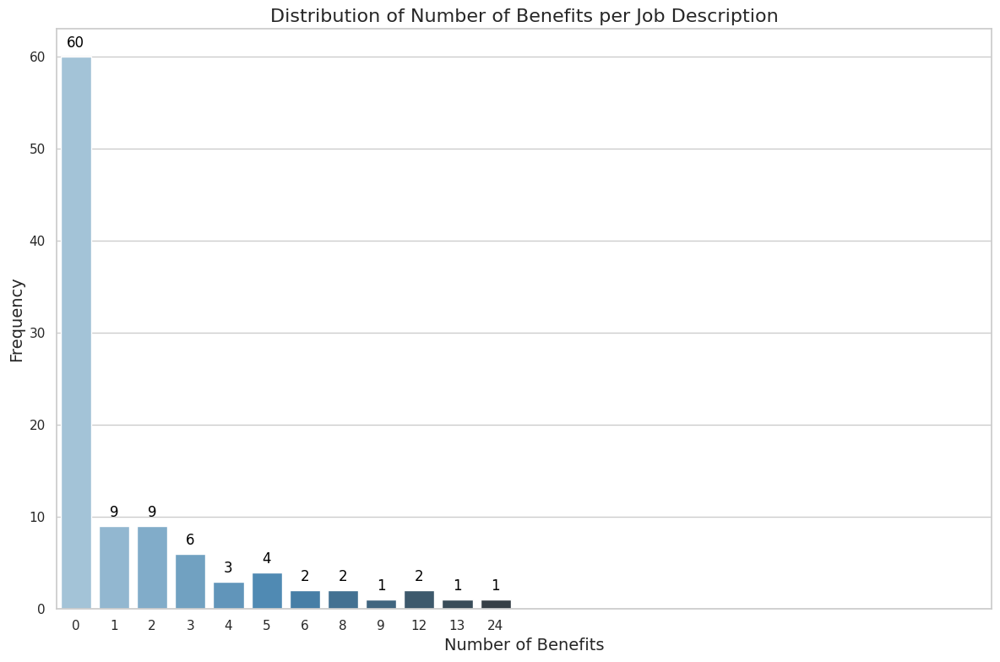

In [0]:
df_data_copy = df_data.copy()

# Define a function to calculate 'num_benefits'
def calculate_num_benefits(row):
    # Check if 'text' is blank (NaN or empty string)
    if pd.isna(row['text']) or row['text'].strip() == '':
        return 0
    # Check if 'model_extracted_benefits' is a non-empty string
    if isinstance(row['model_extracted_benefits'], str):
        benefits_str = row['model_extracted_benefits'].strip()
        if benefits_str == '':
            return 0
        return benefits_str.count(' ||| ') + 1
    else:
        return 0

# Apply the function to create 'num_benefits' column
df_data_copy['num_benefits'] = df_data_copy.apply(calculate_num_benefits, axis=1)

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Initialize the matplotlib figure
plt.figure(figsize=(12, 8))

# Create the countplot for 'num_benefits'
ax = sns.countplot(
    data=df_data_copy,
    x='num_benefits',
    palette='Blues_d',
    order=sorted(df_data_copy['num_benefits'].unique())
)

# Add titles and labels
plt.title('Distribution of Number of Benefits per Job Description', fontsize=16)
plt.xlabel('Number of Benefits', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Annotate each bar with the count as whole numbers
for p in ax.patches:
    height = int(p.get_height())  # Convert to integer to remove decimals
    ax.annotate(
        f'{height}',
        (p.get_x() + p.get_width() / 2., height),
        ha='center', va='bottom',
        fontsize=12,
        color='black',
        xytext=(0, 5),  # Offset text by 5 points above the bar
        textcoords='offset points'
    )

# Ensure that all categories up to the maximum number of benefits are represented
max_benefits = df_data_copy['num_benefits'].max()
plt.xticks(range(0, max_benefits + 1))

# Adjust layout for better fit
plt.tight_layout()

plt.show()

In [0]:
# INSTRUCTION: Manually check rows below that 'model_extracted_benefits' is correct

df_data_copy_filter = df_data_copy[df_data_copy['num_benefits'] >= 10]
count = df_data_copy_filter.shape[0]
print (f"There are {count} JDs with more than 10 benefits")
display(df_data_copy_filter)

There are 4 JDs with more than 10 benefits


id company title industry country text_original text model_extracted_benefits num_benefits 697230 eBay Sr. Project Manager B2C Marketing Technology/E-commerce Germany Looking for a company that inspires passion, courage and creativity, where you can be on the team shaping the future of global commerce? Want to shape how millions of people buy, sell, connect, and share around the world? If you’re interested in joining a purpose driven community that is dedicated to crafting an ambitious and inclusive work environment, join eBay – a company you can be proud to be with. At eBay, we’re passionate about connecting people with the things they love. As the world’s biggest online marketplace, we pride ourselves on technology-led innovation and want to help shape the future of commerce in Germany and the world. We put our customers, buyers, and sellers at the center of everything we do. We are proud of the diversity of our platform, where you find outstanding and everyday items in different conditions – from preloved, refurb to new offered by private sellers, small and medium companies, or big brands. As a global brand, our purpose is to create opportunities: For individual sellers, small businesses, and large merchants Worldwide For shoppers seeking value, selection, and convenience For our people, who seek to make the world better We offer a great culture and encouraging working environment, and this is an exciting opportunity for a commercially minded digital marketing professional to take the next step in their career at one of the most influential brands in Germany. Join our great Marketing team in Dreilinden/Berlin as Sr. Project Manager B2C Marketing ​ (f/m/d) Your Role You will work in the Marketing team running the creative development, delivery, and optimization of our owned channel digital marketing campaigns to delight our customers about our eBay brand, build trust and engage them to buy and sell on our marketplace. You can influence how we show up to our customers every day and at key retail moments onsite across app, mweb, and desktop, and in email. You are experienced in running the end-to-end creative process from brief to execution, and proactive in recommending how we engage and encourage our customers and maximise our technology to improve campaign performance and deliver on standard methodology digital marketing. Are you growing when identifying and implementing innovative marketing tactics to deliver commercial results? An in-depth knowledge of B2C marketing and campaign delivery, blending technical expertise and knowledge of customer engagement tactics, is important. You will be a self-motivated and proactive communicator who is eager to learn and have some fun along the way. You will have strong attention to detail and enjoy working in a fast-paced environment. Your Responsibilities: Close collaboration with customer insights to understand buyer needs and barriers Collaboration with in-country business teams to understand business strategy and the competitive landscape Drive the end-to-end execution of marketing campaigns, including defining customer targeting and channel details Partner with agencies, write creative briefs and guide asset development, execute on ops processes to traffic and QA (Quality Assurance) campaigns Analyze campaign results, make data-driven decisions for continuous improvement, and identification of new opportunities or efficiencies Optimize the customer journey and messaging based on customer feedback, funnel metrics, end-to-end QA process, and continuous monitoring Develop cross-functional partnerships and have a sense of curiosity to identify new opportunities and drive continuous innovation Your Profile: Completed university studies – preferably in the field of marketing and/or eCommerce Excellent written and spoken German and English Validated experience in go-to-market planning, email channel marketing, onsite channel marketing, online retail marketing, or related Shown success in

## Clean-up the extracted benefits output benefits extracted output, preparing it for the Benefits Text Categorisation model

In [0]:
# Exploding rows so that JDs with more than 1 benefit have a benefit per row
def split_benefits(df, model_extracted_benefits, benefits_split):

    new_rows = []

    # Iterate through the DataFrame
    for idx, row in df.iterrows():
        benefits = str(row[model_extracted_benefits]).split(' ||| ')
        for benefit in benefits:
            new_row = row.copy()
            new_row[benefits_split] = benefit
            new_rows.append(new_row)
    return pd.DataFrame(new_rows)

df_split_benefits = split_benefits(df_data, 'model_extracted_benefits', 'benefits_split')
display(df_split_benefits)

id company title industry country text_original text model_extracted_benefits benefits_split 156363 DNV GL Senior Loads Measurements Engineer Professional Services Germany 


 
 
 
 
 
Senior Loads Measurements Engineer 
 
 
 
 Location 
 
DE-Kaiser-Wilhelm-Koog | DE-Hamburg 
 
 
 
 
 
 
 Requisition ID 
 
2022-17908 
 
 
 
 Business Area 
 
Energy Systems 
 
 
 
 Category/Discipline 
 
Engineering 
 
 
 
 Posting Position Type 
 
Permanent Employee 
 
 
 
 
 
 




























 



Local Unit & Position Description


 



 
 
 
 The Section Loads, Power Performance and Wind Resource is part of the Department “Measurements Northern Europe” and is located in Hamburg and Kaiser-Wilhelm-Koog, Germany. The Section measures and analyses the loads on the whole structure of a wind turbine, evaluates the characteristic power curve of a specific turbine, measures the wind speed on site and provides diverse services involving LiDAR technology including equipment verification, classification as well as wind resource and power performance assessment.   The Section currently consists of 17 employees.   Responsibilities: Technical Project Delivery of wind turbine loads measurements projects Responsible lead and project manager for larger and challenging projects Preparation, execution and administration Lead and supervision of project team Planning and supervision / execution of installation and commissioning of loads measurement equipment Data acquisition, plausibility check, post-processing, analysis and evaluation Programming and quality control of tools required for project execution Reporting and checking reports Development of state-of-the-art content to present at conferences and/or online posting Act as an active member in committee work and represent DNV 

 
 
 





 



Position Qualifications


 



 
 
 
 Essential skills and experience for this role are as follows: A technical higher education degree (minimum Bachelor) in a relevant field Deep knowledge of and experience with wind turbine loads measurements (4-6 years as a minimum) Deep understanding of all relevant standards and recommended practices involving wind turbine loads measurements Programming of algorithm and data analysis (we work with MATLAB, Python and FAMOS) Excellent organisational and time management skills Excellent communication skills in English, both written and oral Working knowledge of German, both written and oral Willingness to travel (domestic and international) Driver's license Suitably qualified and/or willing to take part in health and safety trainings to undertake working at heights, work on construction sites, and work involving electrical hazards (and any other required trainings e.g. confined spaces training as applicable)   Join us and you will: Work with dedicated, competent, highly educated and specialized colleagues in a global set up Be part of an international team with diverse backgrounds and an open, cooperative working atmosphere Be exposed to demanding customer inquiries in an interesting and challenging, international environment with diverse international projects Experience exciting challenges and a new way of thinking in an ever-changing energy world Have an exciting and attractive working environment with a high degree of individual responsibility which you can actively shape Benefit from attractive, individual training and development opportunities as well as an attractive salary package Flexible place of work (in an attractive office, from home and in our clients' facilities) and flexible working hours The opportunity to actively shape the energy transition 

 
 
 





 



Company & Business Area Description


 



 
 
 
 DNV is the independent expert in assurance and risk management, operating in more than 100 countries. Through our broad experience and deep expertise we advance safety and sustainable performance, set industry benchmarks, and inspire and invent solutions.    We provide assurance to the entire en

In [0]:
# Cleaning benefits extracted by grammer/extra characters/etc.

def clean_dataframe(df, text_column):
    # Reset the index to ensure it is properly aligned
    df = df.reset_index(drop=True)

    # Initialize counter to track total number of replacements
    counter_fixes = 0

    # Create a new column for the cleaned text
    df['benefits_cleaned'] = df[text_column]

    # Define the cleaning function
    def clean_text(text):
        nonlocal counter_fixes
        
        # Check if the input is a string; if not, return as is
        if not isinstance(text, str):
            return text
        
        original_text = text  # Keep the original text for comparison

        # Use regex to remove unwanted characters and words at the end
        cleaned_text = re.sub(
            r'([.,;:!•\-?(]*\b(and|or)\b[.,;:!•\-?(]*|[.,;:!•\-?(]+)$',
            '',
            text
        ).strip()

        # Additional check for text ending with ')' but no '(' elsewhere
        if cleaned_text.endswith(')') and '(' not in cleaned_text[:-1]:
            cleaned_text = cleaned_text[:-1].rstrip()

        # Update counter if changes were made
        if cleaned_text != original_text:
            counter_fixes += 1

        return cleaned_text

    # Apply the cleaning function to the text column
    df['benefits_cleaned'] = df[text_column].apply(clean_text)

    # Print the total number of changes made
    print(f"Total replacements made: {counter_fixes}")

    return df

df_cleaned = clean_dataframe(df_split_benefits, 'benefits_split')
df_cleaned = df_cleaned.drop(columns=['text_original', 'benefits_split'])

display(df_cleaned)

Total replacements made: 5


id company title industry country text model_extracted_benefits benefits_cleaned 156363 DNV GL Senior Loads Measurements Engineer Professional Services Germany Senior Loads Measurements Engineer
==================================

Location
DE-Kaiser-Wilhelm-Koog | DE-Hamburg

Requisition ID
2022-17908

Business Area
Energy Systems

Category/Discipline
Engineering

Posting Position Type
Permanent Employee

Local Unit & Position Description
---------------------------------

The Section Loads, Power Performance and Wind Resource is part of the Department "Measurements Northern Europe" and is located in Hamburg and Kaiser-Wilhelm-Koog, Germany. The Section measures and analyses the loads on the whole structure of a wind turbine, evaluates the characteristic power curve of a specific turbine, measures the wind speed on site and provides diverse services involving LiDAR technology including equipment verification, classification as well as wind resource and power performance assessment.

The Section currently consists of 17 employees.

Responsibilities:

* Technical Project Delivery of wind turbine loads measurements projects
* Responsible lead and project manager for larger and challenging projects

+ Preparation, execution and administration
+ Lead and supervision of project team
+ Planning and supervision / execution of installation and commissioning of loads measurement equipment
+ Data acquisition, plausibility check, post-processing, analysis and evaluation
+ Programming and quality control of tools required for project execution
+ Reporting and checking reports

* Development of state-of-the-art content to present at conferences and/or online posting
* Act as an active member in committee work and represent DNV

Position Qualifications
-----------------------

Essential skills and experience for this role are as follows:

* A technical higher education degree (minimum Bachelor) in a relevant field
* Deep knowledge of and experience with wind turbine loads measurements (4-6 years as a minimum)
* Deep understanding of all relevant standards and recommended practices involving wind turbine loads measurements
* Programming of algorithm and data analysis (we work with MATLAB, Python and FAMOS)
* Excellent organisational and time management skills
* Excellent communication skills in English, both written and oral
* Working knowledge of German, both written and oral
* Willingness to travel (domestic and international)
* Driver's license

Suitably qualified and/or willing to take part in health and safety trainings to undertake working at heights, work on construction sites, and work involving electrical hazards (and any other required trainings e.g. confined spaces training as applicable)

Join us and you will:

* Work with dedicated, competent, highly educated and specialized colleagues in a global set up
* Be part of an international team with diverse backgrounds and an open, cooperative working atmosphere
* Be exposed to demanding customer inquiries in an interesting and challenging, international environment with diverse international projects
* Experience exciting challenges and a new way of thinking in an ever-changing energy world
* Have an exciting and attractive working environment with a high degree of individual responsibility which you can actively shape
* Benefit from attractive, individual training and development opportunities as well as an attractive salary package
* Flexible place of work (in an attractive office, from home and in our clients' facilities) and flexible working hours
* The opportunity to actively shape the energy transition

Company & Business Area Description
-----------------------------------

DNV is the independent expert in assurance and risk management, operating in more than 100 countries. Through our broad experience and deep expertise we advance safety and sustainable performance, set industry benchmarks, and inspire and invent solutions.

We provide assurance to the entire energy value chai

## (OPTIONAL STEP)
## If you disagree with some of the benefits extracted and would like to edit manually, you can download and edit it as a csv in excel then re-upload into notebook
- ### Make sure to only edit the values in the 'benefits_cleaned' column

In [0]:
# INSTRUCTION: Save to your workspace and export to open in excel
df_cleaned.to_csv('/Workspace/Users/justin.ngam@towerswatson.com/1_Benefits/1_NER/Data/~ov/Model_Training/v5/EVALUATION/data/df_cleaned.csv', index=False)

In [0]:
# INSTRUCTION: Load in your edited data
df_cleaned = pd.read_csv('/Workspace/Users/justin.ngam@towerswatson.com/1_Benefits/1_NER/Data/~ov/Model_Training/v5/EVALUATION/data/df_cleaned.csv')

## Now we run through Benefits Text Categorisation

In [0]:
# INSTRUCTION: Make sure you are using the correct NER model version

benefits_text_categorisation_model = "/Workspace/Users/justin.ngam@towerswatson.com/1_Benefits/2_Text Classification/~ov/models/v0.2/model-best"

nlp_categorisation = spacy.load(benefits_text_categorisation_model)

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/spacy/util.py:910: UserWarning: [W095] Model 'en_pipeline' (0.0.0) was trained with spaCy v3.8.2 and may not be 100% compatible with the current version (3.7.5). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/spacy_transformers/layers/hf_shim.py:124: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_

In [0]:
# INSTRUCTION: Set the 'threshold_set' of the function. 0.9 is standard such that we only classify a benefit as a certain category if the model is sure. Set higher e.g. 0.95 to be very sure. Set lower e.g. 0.8 to allow ease threshold for categorisation

threshold_set = 0.9

# Function to extract all labels and their confidence scores above a threshold, as well as second-highest just for check
def extract_labels_info(text, threshold=threshold_set):
    # Check if 'text' is a non-empty string
    if not isinstance(text, str) or not text.strip():
        return pd.Series({
            'labels': [],
            'scores': [],
            'labels_second': None,
            'scores_second': None
        })
    
    try:
        # Apply the NLP categorization model
        doc = nlp_categorisation(text)
    except Exception as e:
        return pd.Series({
            'labels': [],
            'scores': [],
            'labels_second': None,
            'scores_second': None
        })

    # Check if the model returned any categories
    if not hasattr(doc, 'cats') or not doc.cats:
        return pd.Series({
            'labels': [],
            'scores': [],
            'labels_second': None,
            'scores_second': None
        })
    
    # Sort all categories by score in descending order
    sorted_cats = sorted(doc.cats.items(), key=lambda item: item[1], reverse=True)
    
    # Extract labels and scores above the threshold
    labels_and_scores = [(label, score) for label, score in sorted_cats if score >= threshold]
    
    # Prepare 'labels' and 'scores' lists
    labels = [label for label, score in labels_and_scores]
    scores = [round(score, 3) for label, score in labels_and_scores]
    
    # Identify the next-highest scoring label not in 'labels'
    labels_set = set(labels)  # For efficient lookup
    labels_second = None
    scores_second = None
    
    for label, score in sorted_cats:
        if label not in labels_set:
            labels_second = label
            scores_second = round(score, 2)
            break  # Stop after finding the first such label
    
    return pd.Series({
        'labels': labels,
        'scores': scores,
        'labels_second': labels_second,
        'scores_second': scores_second
    })

In [0]:
# Apply the function to the 'benefits_split' column and create new columns
# Convert the 'benefits_cleaned' column to string type
df_cleaned[['labels', 'scores', 'labels_second', 'scores_second']] = df_cleaned['benefits_cleaned'].apply(extract_labels_info)
display(df_cleaned)

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/thinc/shims/pytorch.py:114: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(self._mixed_precision):
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/thinc/shims/pytorch.py:114: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(self._mixed_precision):
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/thinc/shims/pytorch.py:114: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(self._mixed_precision):
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/thinc/shims/pytorch.py:114: FutureWarning: `torch.cuda

id company title industry country text model_extracted_benefits benefits_cleaned labels scores labels_second scores_second 156363 DNV GL Senior Loads Measurements Engineer Professional Services Germany Senior Loads Measurements Engineer
==================================

Location
DE-Kaiser-Wilhelm-Koog | DE-Hamburg

Requisition ID
2022-17908

Business Area
Energy Systems

Category/Discipline
Engineering

Posting Position Type
Permanent Employee

Local Unit & Position Description
---------------------------------

The Section Loads, Power Performance and Wind Resource is part of the Department "Measurements Northern Europe" and is located in Hamburg and Kaiser-Wilhelm-Koog, Germany. The Section measures and analyses the loads on the whole structure of a wind turbine, evaluates the characteristic power curve of a specific turbine, measures the wind speed on site and provides diverse services involving LiDAR technology including equipment verification, classification as well as wind resource and power performance assessment.

The Section currently consists of 17 employees.

Responsibilities:

* Technical Project Delivery of wind turbine loads measurements projects
* Responsible lead and project manager for larger and challenging projects

+ Preparation, execution and administration
+ Lead and supervision of project team
+ Planning and supervision / execution of installation and commissioning of loads measurement equipment
+ Data acquisition, plausibility check, post-processing, analysis and evaluation
+ Programming and quality control of tools required for project execution
+ Reporting and checking reports

* Development of state-of-the-art content to present at conferences and/or online posting
* Act as an active member in committee work and represent DNV

Position Qualifications
-----------------------

Essential skills and experience for this role are as follows:

* A technical higher education degree (minimum Bachelor) in a relevant field
* Deep knowledge of and experience with wind turbine loads measurements (4-6 years as a minimum)
* Deep understanding of all relevant standards and recommended practices involving wind turbine loads measurements
* Programming of algorithm and data analysis (we work with MATLAB, Python and FAMOS)
* Excellent organisational and time management skills
* Excellent communication skills in English, both written and oral
* Working knowledge of German, both written and oral
* Willingness to travel (domestic and international)
* Driver's license

Suitably qualified and/or willing to take part in health and safety trainings to undertake working at heights, work on construction sites, and work involving electrical hazards (and any other required trainings e.g. confined spaces training as applicable)

Join us and you will:

* Work with dedicated, competent, highly educated and specialized colleagues in a global set up
* Be part of an international team with diverse backgrounds and an open, cooperative working atmosphere
* Be exposed to demanding customer inquiries in an interesting and challenging, international environment with diverse international projects
* Experience exciting challenges and a new way of thinking in an ever-changing energy world
* Have an exciting and attractive working environment with a high degree of individual responsibility which you can actively shape
* Benefit from attractive, individual training and development opportunities as well as an attractive salary package
* Flexible place of work (in an attractive office, from home and in our clients' facilities) and flexible working hours
* The opportunity to actively shape the energy transition

Company & Business Area Description
-----------------------------------

DNV is the independent expert in assurance and risk management, operating in more than 100 countries. Through our broad experience and deep expertise we advance safety and sustainable performance, set industry benchmarks, and inspire and invent solutions.

We provide

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
ERROR:root:Exception while sending command.
Traceback (most recent call last):
  File "/databricks/spark/python/lib/py4j-0.10.9.7-src.zip/py4j/clientserver.py", line 536, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
  File "/usr/lib/python3.10/socket.py", line 705, in readinto
    return self._sock.recv_into(b)
ConnectionResetError: [Errno 104] Connection reset by peer

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/databricks/spark/python/lib/py4j-0.10.9.7-src.zip/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
  File "/databri

## Now save your dataframe. Important columns with info:
### - 'benefits_cleaned' -> Benefits extracted by the NER model
### - 'labels' -> Benefits categories applied to each benefit by the Categorisation model